# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

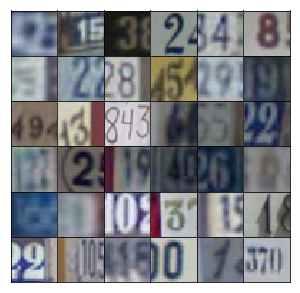

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), self.scaler(y)

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        fc = tf.layers.dense(z, 2*2*1024, activation=None)
        # Reshape
        fc = tf.reshape(fc, [-1, 2, 2, 1024])
        fc = tf.layers.batch_normalization(fc, training=training)
        fc = tf.maximum(alpha * fc, fc)
        
        # Convt1
        convt1 = tf.layers.conv2d_transpose(fc, 512, 5, strides=(2,2), padding='same')
        convt1 = tf.layers.batch_normalization(convt1, training=training)
        convt1 = tf.maximum(alpha * convt1, convt1)
        # output is now 4x4x512
        
        # Convt2
        convt2 = tf.layers.conv2d_transpose(convt1, 256, 5, strides=(2,2), padding='same')
        convt2 = tf.layers.batch_normalization(convt2, training=training)
        convt2 = tf.maximum(alpha * convt2, convt2)
        # output is now 8x8x256    
    
        # Convt3
        convt3 = tf.layers.conv2d_transpose(convt2, 128, 5, strides=(2,2), padding='same')
        convt3 = tf.layers.batch_normalization(convt3, training=training)
        convt3 = tf.maximum(alpha * convt3, convt3)
        # output is now 16x16x128
    
    
        # Convt4 == Output layer, 32x32x3
        logits = convt4 = tf.layers.conv2d_transpose(convt3, output_dim, 5, strides=(2,2), padding='same')
        # output is now 32x32x3
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [10]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
      
        # Input layer is 32x32x3
        # Input Layer - Conv1
        conv1 = tf.layers.conv2d(x, 64, 5, strides=(2,2), padding='same')
        conv1 = tf.maximum(alpha * conv1, conv1)
        # output is now 16x16x64
        
        # Conv2
        conv2 = tf.layers.conv2d(conv1, 128, 5, strides=(2,2), padding='same')
        conv2 = tf.layers.batch_normalization(conv2, training=True)
        conv2 = tf.maximum(alpha * conv2, conv2)
        # output is now 8x8x128
        
        # Conv3
        conv3 = tf.layers.conv2d(conv2, 256, 5, strides=(2,2), padding='same')
        conv3 = tf.layers.batch_normalization(conv3, training=True)
        conv3 = tf.maximum(alpha * conv3, conv3)
        # output is now 4x4x256
        
        # Fully Connected Layer
        fc = tf.reshape(conv3, [-1, 4*4*256])
        fc = tf.layers.dense(fc, 1, activation=None)
        
        logits = fc
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [11]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [13]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=0.2)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, 0.5)

Here is a function for displaying generated images.

In [14]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an errror without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [15]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very senstive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [16]:
"""
# ORIGINAL - HERE
real_size = (32,32,3)
z_size = 100
learning_rate = 0.001
batch_size = 64
epochs = 1
alpha = 0.01
beta1 = 0.9
"""

# BEST
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 25 # 25
alpha = 0.2
beta1 = 0.5


# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/25... Discriminator Loss: 1.7164... Generator Loss: 0.4694
Epoch 1/25... Discriminator Loss: 0.6089... Generator Loss: 2.0982
Epoch 1/25... Discriminator Loss: 0.5001... Generator Loss: 1.3562
Epoch 1/25... Discriminator Loss: 0.4293... Generator Loss: 1.8265
Epoch 1/25... Discriminator Loss: 0.5389... Generator Loss: 1.5309
Epoch 1/25... Discriminator Loss: 0.2834... Generator Loss: 1.8501
Epoch 1/25... Discriminator Loss: 0.2735... Generator Loss: 2.0013
Epoch 1/25... Discriminator Loss: 0.3890... Generator Loss: 1.9184
Epoch 1/25... Discriminator Loss: 0.3220... Generator Loss: 2.1049
Epoch 1/25... Discriminator Loss: 0.7130... Generator Loss: 1.2253


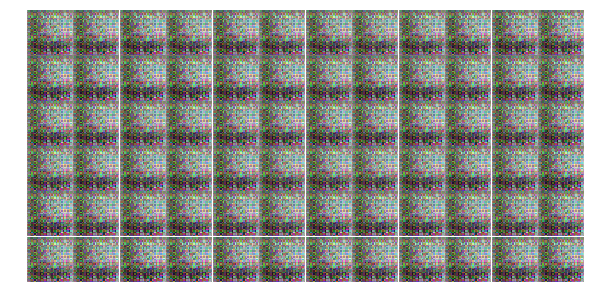

Epoch 1/25... Discriminator Loss: 0.4459... Generator Loss: 1.1843
Epoch 1/25... Discriminator Loss: 0.4847... Generator Loss: 1.9497
Epoch 1/25... Discriminator Loss: 0.2052... Generator Loss: 2.4733
Epoch 1/25... Discriminator Loss: 0.2366... Generator Loss: 2.4100
Epoch 1/25... Discriminator Loss: 0.2304... Generator Loss: 2.4038
Epoch 1/25... Discriminator Loss: 0.3327... Generator Loss: 1.8570
Epoch 1/25... Discriminator Loss: 0.1492... Generator Loss: 2.7974
Epoch 1/25... Discriminator Loss: 0.1363... Generator Loss: 3.1328
Epoch 1/25... Discriminator Loss: 0.7569... Generator Loss: 1.8086
Epoch 1/25... Discriminator Loss: 1.0357... Generator Loss: 1.4468


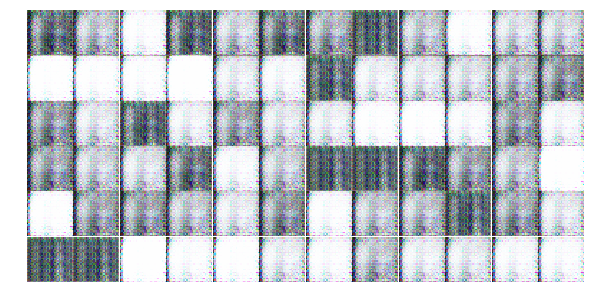

Epoch 1/25... Discriminator Loss: 1.0673... Generator Loss: 1.4889
Epoch 1/25... Discriminator Loss: 0.8680... Generator Loss: 2.3791
Epoch 1/25... Discriminator Loss: 0.8211... Generator Loss: 1.4025
Epoch 1/25... Discriminator Loss: 0.8140... Generator Loss: 1.3675
Epoch 1/25... Discriminator Loss: 0.8873... Generator Loss: 2.0886
Epoch 1/25... Discriminator Loss: 1.2875... Generator Loss: 1.3424
Epoch 1/25... Discriminator Loss: 1.1785... Generator Loss: 0.6061
Epoch 1/25... Discriminator Loss: 0.5263... Generator Loss: 1.8374
Epoch 1/25... Discriminator Loss: 1.4060... Generator Loss: 1.7474
Epoch 1/25... Discriminator Loss: 0.8954... Generator Loss: 1.1060


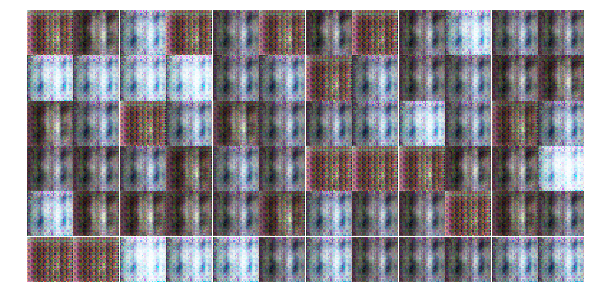

Epoch 1/25... Discriminator Loss: 0.5462... Generator Loss: 1.8640
Epoch 1/25... Discriminator Loss: 0.5501... Generator Loss: 1.5522
Epoch 1/25... Discriminator Loss: 0.8461... Generator Loss: 1.3855
Epoch 1/25... Discriminator Loss: 1.4069... Generator Loss: 0.4690
Epoch 1/25... Discriminator Loss: 0.6785... Generator Loss: 1.4090
Epoch 1/25... Discriminator Loss: 0.9640... Generator Loss: 0.8652
Epoch 1/25... Discriminator Loss: 1.0283... Generator Loss: 1.1032
Epoch 1/25... Discriminator Loss: 0.9665... Generator Loss: 1.1453
Epoch 1/25... Discriminator Loss: 0.4606... Generator Loss: 1.6266
Epoch 1/25... Discriminator Loss: 1.4773... Generator Loss: 0.6903


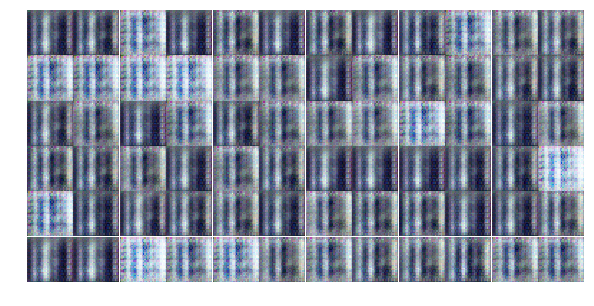

Epoch 1/25... Discriminator Loss: 0.6501... Generator Loss: 1.3405
Epoch 1/25... Discriminator Loss: 0.3257... Generator Loss: 1.9396
Epoch 1/25... Discriminator Loss: 0.1942... Generator Loss: 2.6993
Epoch 1/25... Discriminator Loss: 0.5023... Generator Loss: 2.2124
Epoch 1/25... Discriminator Loss: 0.3837... Generator Loss: 1.7823
Epoch 1/25... Discriminator Loss: 0.7450... Generator Loss: 3.0324
Epoch 1/25... Discriminator Loss: 0.3644... Generator Loss: 1.9814
Epoch 1/25... Discriminator Loss: 0.2218... Generator Loss: 2.4318
Epoch 1/25... Discriminator Loss: 0.7110... Generator Loss: 1.2036
Epoch 1/25... Discriminator Loss: 0.5692... Generator Loss: 1.7234


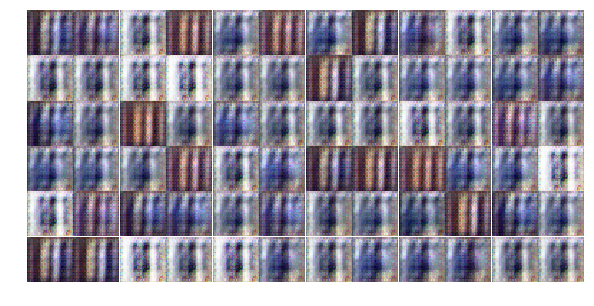

Epoch 1/25... Discriminator Loss: 0.5088... Generator Loss: 1.4103
Epoch 1/25... Discriminator Loss: 0.4335... Generator Loss: 1.5436
Epoch 1/25... Discriminator Loss: 0.4277... Generator Loss: 1.5728
Epoch 1/25... Discriminator Loss: 0.7799... Generator Loss: 1.3041
Epoch 1/25... Discriminator Loss: 0.7363... Generator Loss: 1.4275
Epoch 1/25... Discriminator Loss: 0.4219... Generator Loss: 1.5301
Epoch 1/25... Discriminator Loss: 0.5928... Generator Loss: 1.3266
Epoch 2/25... Discriminator Loss: 0.6062... Generator Loss: 1.4282
Epoch 2/25... Discriminator Loss: 0.4394... Generator Loss: 1.6168
Epoch 2/25... Discriminator Loss: 0.9832... Generator Loss: 1.5291


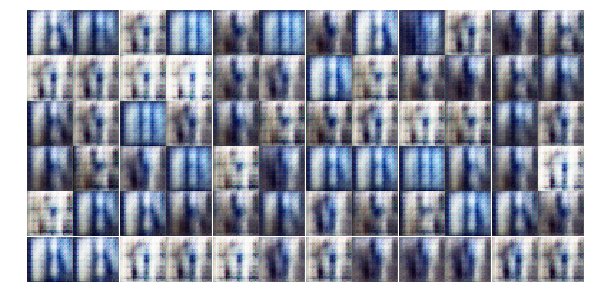

Epoch 2/25... Discriminator Loss: 1.2835... Generator Loss: 0.6061
Epoch 2/25... Discriminator Loss: 1.0743... Generator Loss: 1.0974
Epoch 2/25... Discriminator Loss: 0.4665... Generator Loss: 1.7749
Epoch 2/25... Discriminator Loss: 0.5037... Generator Loss: 2.6971
Epoch 2/25... Discriminator Loss: 0.5313... Generator Loss: 1.8692
Epoch 2/25... Discriminator Loss: 0.5859... Generator Loss: 1.1865
Epoch 2/25... Discriminator Loss: 0.4429... Generator Loss: 2.1459
Epoch 2/25... Discriminator Loss: 0.2324... Generator Loss: 2.0227
Epoch 2/25... Discriminator Loss: 0.2980... Generator Loss: 3.3757
Epoch 2/25... Discriminator Loss: 0.5172... Generator Loss: 4.4637


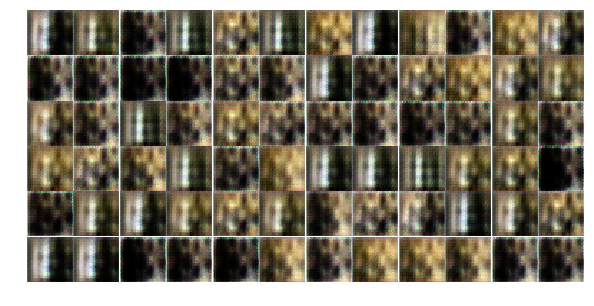

Epoch 2/25... Discriminator Loss: 0.3991... Generator Loss: 1.5869
Epoch 2/25... Discriminator Loss: 0.8524... Generator Loss: 0.8982
Epoch 2/25... Discriminator Loss: 0.4145... Generator Loss: 2.0270
Epoch 2/25... Discriminator Loss: 0.6294... Generator Loss: 1.1256
Epoch 2/25... Discriminator Loss: 0.4153... Generator Loss: 2.5304
Epoch 2/25... Discriminator Loss: 0.5963... Generator Loss: 1.1651
Epoch 2/25... Discriminator Loss: 1.6771... Generator Loss: 4.2416
Epoch 2/25... Discriminator Loss: 0.8256... Generator Loss: 1.3830
Epoch 2/25... Discriminator Loss: 0.4914... Generator Loss: 1.8734
Epoch 2/25... Discriminator Loss: 1.2534... Generator Loss: 0.4609


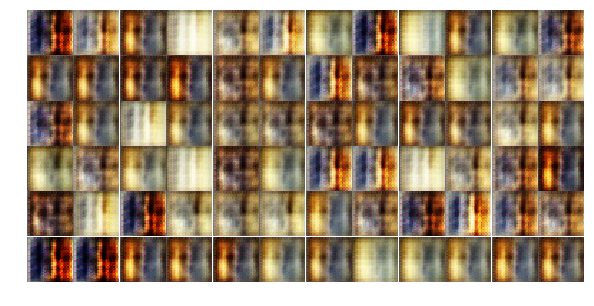

Epoch 2/25... Discriminator Loss: 0.2621... Generator Loss: 2.6441
Epoch 2/25... Discriminator Loss: 0.5872... Generator Loss: 1.6043
Epoch 2/25... Discriminator Loss: 0.7986... Generator Loss: 0.9052
Epoch 2/25... Discriminator Loss: 0.6760... Generator Loss: 1.0607
Epoch 2/25... Discriminator Loss: 0.2960... Generator Loss: 1.9639
Epoch 2/25... Discriminator Loss: 0.4044... Generator Loss: 1.8828
Epoch 2/25... Discriminator Loss: 0.2311... Generator Loss: 2.4533
Epoch 2/25... Discriminator Loss: 0.5178... Generator Loss: 2.0496
Epoch 2/25... Discriminator Loss: 0.1827... Generator Loss: 2.3255
Epoch 2/25... Discriminator Loss: 0.3839... Generator Loss: 1.6992


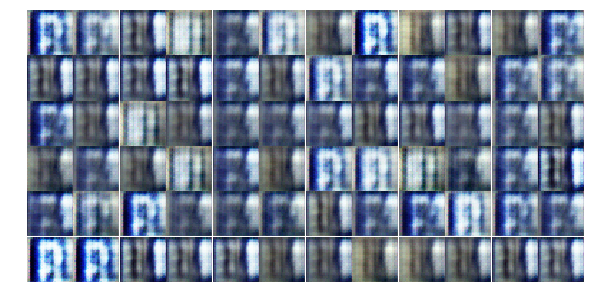

Epoch 2/25... Discriminator Loss: 0.7535... Generator Loss: 3.2793
Epoch 2/25... Discriminator Loss: 0.4937... Generator Loss: 1.7787
Epoch 2/25... Discriminator Loss: 0.6494... Generator Loss: 1.3077
Epoch 2/25... Discriminator Loss: 0.7816... Generator Loss: 1.8126
Epoch 2/25... Discriminator Loss: 0.4944... Generator Loss: 1.8900
Epoch 2/25... Discriminator Loss: 1.0239... Generator Loss: 1.0998
Epoch 2/25... Discriminator Loss: 0.8638... Generator Loss: 0.9988
Epoch 2/25... Discriminator Loss: 0.2771... Generator Loss: 3.7372
Epoch 2/25... Discriminator Loss: 0.4066... Generator Loss: 2.0781
Epoch 2/25... Discriminator Loss: 0.6794... Generator Loss: 1.1862


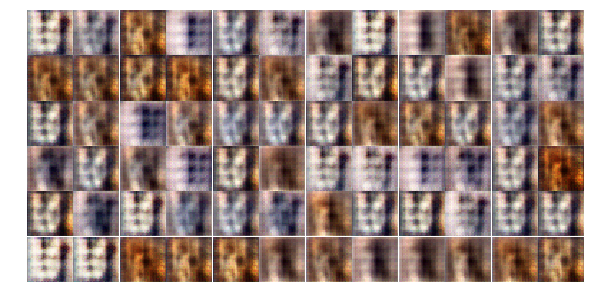

Epoch 2/25... Discriminator Loss: 0.5222... Generator Loss: 1.8487
Epoch 2/25... Discriminator Loss: 0.4638... Generator Loss: 1.9912
Epoch 2/25... Discriminator Loss: 0.4166... Generator Loss: 1.5930
Epoch 2/25... Discriminator Loss: 0.4891... Generator Loss: 1.9503
Epoch 2/25... Discriminator Loss: 0.5112... Generator Loss: 1.7324
Epoch 2/25... Discriminator Loss: 0.6020... Generator Loss: 1.4404
Epoch 2/25... Discriminator Loss: 1.1178... Generator Loss: 6.4408
Epoch 2/25... Discriminator Loss: 0.7123... Generator Loss: 2.5571
Epoch 2/25... Discriminator Loss: 0.3138... Generator Loss: 2.4392
Epoch 2/25... Discriminator Loss: 0.2897... Generator Loss: 2.2704


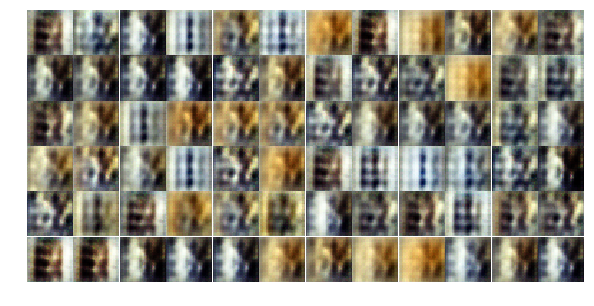

Epoch 2/25... Discriminator Loss: 0.5336... Generator Loss: 1.7983
Epoch 2/25... Discriminator Loss: 0.5801... Generator Loss: 1.5319
Epoch 2/25... Discriminator Loss: 1.0597... Generator Loss: 1.1472
Epoch 2/25... Discriminator Loss: 0.8134... Generator Loss: 1.9949
Epoch 3/25... Discriminator Loss: 0.4895... Generator Loss: 2.9230
Epoch 3/25... Discriminator Loss: 0.4113... Generator Loss: 1.9413
Epoch 3/25... Discriminator Loss: 1.2334... Generator Loss: 4.6995
Epoch 3/25... Discriminator Loss: 0.5058... Generator Loss: 2.7822
Epoch 3/25... Discriminator Loss: 0.7376... Generator Loss: 1.2831
Epoch 3/25... Discriminator Loss: 1.6790... Generator Loss: 0.3849


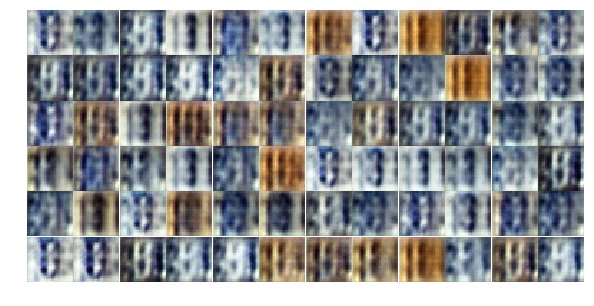

Epoch 3/25... Discriminator Loss: 0.4904... Generator Loss: 1.9333
Epoch 3/25... Discriminator Loss: 0.5952... Generator Loss: 1.7154
Epoch 3/25... Discriminator Loss: 0.6220... Generator Loss: 1.2812
Epoch 3/25... Discriminator Loss: 0.8239... Generator Loss: 1.4059
Epoch 3/25... Discriminator Loss: 1.2925... Generator Loss: 0.5540
Epoch 3/25... Discriminator Loss: 0.7326... Generator Loss: 1.6144
Epoch 3/25... Discriminator Loss: 0.7095... Generator Loss: 1.4305
Epoch 3/25... Discriminator Loss: 0.5303... Generator Loss: 1.5356
Epoch 3/25... Discriminator Loss: 0.8523... Generator Loss: 1.2255
Epoch 3/25... Discriminator Loss: 0.5554... Generator Loss: 1.6629


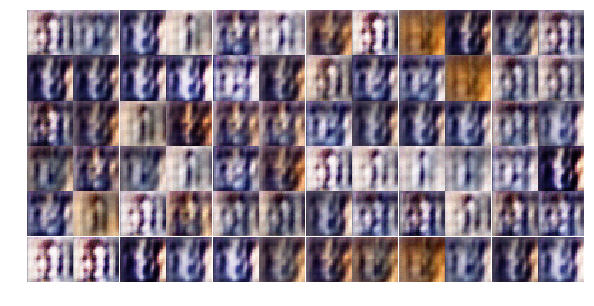

Epoch 3/25... Discriminator Loss: 0.5067... Generator Loss: 1.9818
Epoch 3/25... Discriminator Loss: 0.7987... Generator Loss: 1.3856
Epoch 3/25... Discriminator Loss: 0.3643... Generator Loss: 2.2024
Epoch 3/25... Discriminator Loss: 1.2764... Generator Loss: 0.5719
Epoch 3/25... Discriminator Loss: 0.9024... Generator Loss: 1.0363
Epoch 3/25... Discriminator Loss: 0.7458... Generator Loss: 1.5396
Epoch 3/25... Discriminator Loss: 1.6300... Generator Loss: 0.2632
Epoch 3/25... Discriminator Loss: 0.4635... Generator Loss: 2.1007
Epoch 3/25... Discriminator Loss: 0.6224... Generator Loss: 1.4611
Epoch 3/25... Discriminator Loss: 0.9309... Generator Loss: 1.1776


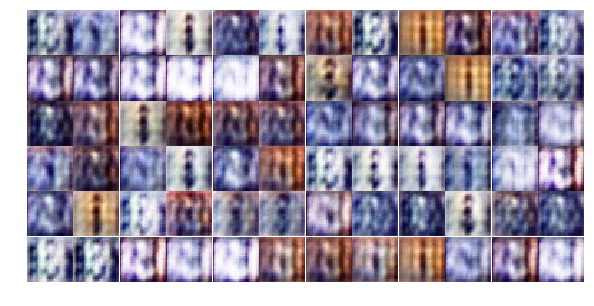

Epoch 3/25... Discriminator Loss: 0.5794... Generator Loss: 1.3232
Epoch 3/25... Discriminator Loss: 0.6513... Generator Loss: 1.8255
Epoch 3/25... Discriminator Loss: 0.8567... Generator Loss: 1.4312
Epoch 3/25... Discriminator Loss: 0.6059... Generator Loss: 1.3449
Epoch 3/25... Discriminator Loss: 0.7494... Generator Loss: 1.4215
Epoch 3/25... Discriminator Loss: 0.8777... Generator Loss: 1.2026
Epoch 3/25... Discriminator Loss: 0.6069... Generator Loss: 1.7893
Epoch 3/25... Discriminator Loss: 0.5533... Generator Loss: 1.5836
Epoch 3/25... Discriminator Loss: 0.4581... Generator Loss: 1.7106
Epoch 3/25... Discriminator Loss: 0.6930... Generator Loss: 2.4584


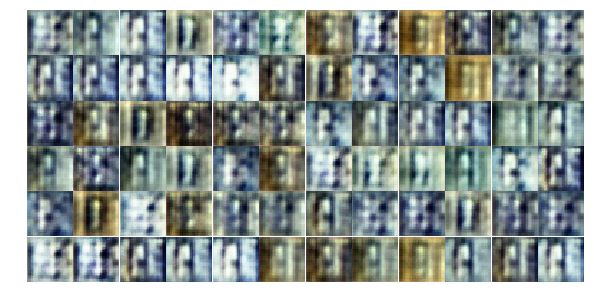

Epoch 3/25... Discriminator Loss: 0.8243... Generator Loss: 1.0167
Epoch 3/25... Discriminator Loss: 0.6124... Generator Loss: 2.0535
Epoch 3/25... Discriminator Loss: 1.0979... Generator Loss: 1.0569
Epoch 3/25... Discriminator Loss: 0.7083... Generator Loss: 1.3002
Epoch 3/25... Discriminator Loss: 0.7676... Generator Loss: 1.6425
Epoch 3/25... Discriminator Loss: 0.5489... Generator Loss: 2.0203
Epoch 3/25... Discriminator Loss: 1.4078... Generator Loss: 2.2639
Epoch 3/25... Discriminator Loss: 0.7995... Generator Loss: 3.0543
Epoch 3/25... Discriminator Loss: 0.6283... Generator Loss: 2.3601
Epoch 3/25... Discriminator Loss: 0.9525... Generator Loss: 1.2496


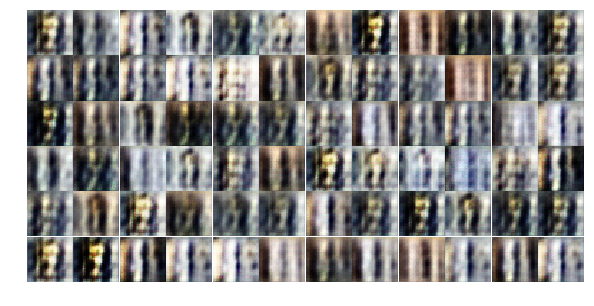

Epoch 3/25... Discriminator Loss: 0.8842... Generator Loss: 1.0618
Epoch 3/25... Discriminator Loss: 0.6239... Generator Loss: 1.7569
Epoch 3/25... Discriminator Loss: 0.7236... Generator Loss: 1.0627
Epoch 3/25... Discriminator Loss: 0.5761... Generator Loss: 1.7023
Epoch 3/25... Discriminator Loss: 0.4126... Generator Loss: 2.1208
Epoch 3/25... Discriminator Loss: 0.5879... Generator Loss: 1.5613
Epoch 3/25... Discriminator Loss: 0.4647... Generator Loss: 2.1035
Epoch 3/25... Discriminator Loss: 0.5150... Generator Loss: 2.3728
Epoch 3/25... Discriminator Loss: 0.6945... Generator Loss: 1.6372
Epoch 3/25... Discriminator Loss: 0.8057... Generator Loss: 1.0946


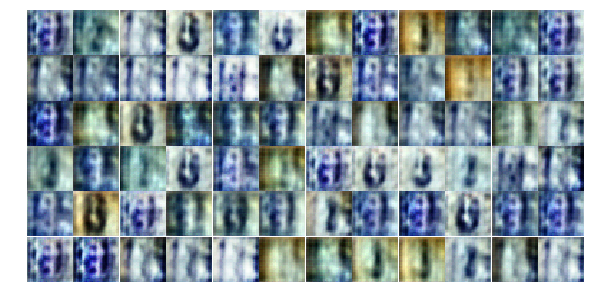

Epoch 3/25... Discriminator Loss: 0.6870... Generator Loss: 1.9724
Epoch 4/25... Discriminator Loss: 0.7823... Generator Loss: 0.9783
Epoch 4/25... Discriminator Loss: 0.6463... Generator Loss: 1.1524
Epoch 4/25... Discriminator Loss: 0.6558... Generator Loss: 1.2102
Epoch 4/25... Discriminator Loss: 0.4381... Generator Loss: 1.6151
Epoch 4/25... Discriminator Loss: 0.7611... Generator Loss: 1.5166
Epoch 4/25... Discriminator Loss: 0.5945... Generator Loss: 2.2879
Epoch 4/25... Discriminator Loss: 0.5976... Generator Loss: 1.4610
Epoch 4/25... Discriminator Loss: 0.5417... Generator Loss: 1.2381
Epoch 4/25... Discriminator Loss: 0.6688... Generator Loss: 1.3725


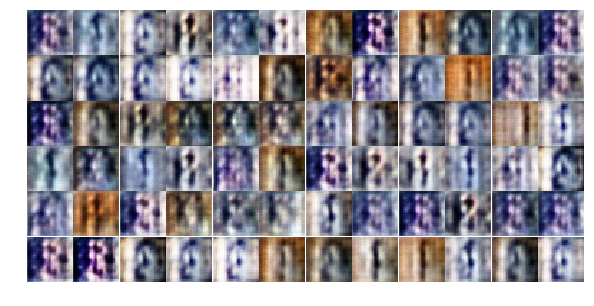

Epoch 4/25... Discriminator Loss: 0.4847... Generator Loss: 2.4402
Epoch 4/25... Discriminator Loss: 0.5754... Generator Loss: 1.3632
Epoch 4/25... Discriminator Loss: 0.7655... Generator Loss: 1.0979
Epoch 4/25... Discriminator Loss: 0.3804... Generator Loss: 2.2265
Epoch 4/25... Discriminator Loss: 0.4207... Generator Loss: 2.5233
Epoch 4/25... Discriminator Loss: 1.1345... Generator Loss: 0.6570
Epoch 4/25... Discriminator Loss: 0.7584... Generator Loss: 1.3561
Epoch 4/25... Discriminator Loss: 0.5893... Generator Loss: 1.9528
Epoch 4/25... Discriminator Loss: 0.7093... Generator Loss: 1.5452
Epoch 4/25... Discriminator Loss: 0.8329... Generator Loss: 2.2954


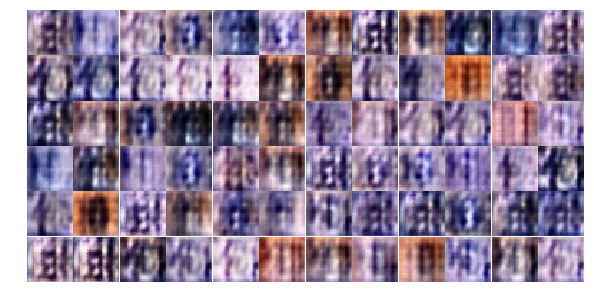

Epoch 4/25... Discriminator Loss: 0.9723... Generator Loss: 1.0287
Epoch 4/25... Discriminator Loss: 0.9136... Generator Loss: 2.8366
Epoch 4/25... Discriminator Loss: 0.6939... Generator Loss: 1.9404
Epoch 4/25... Discriminator Loss: 0.6049... Generator Loss: 1.7856
Epoch 4/25... Discriminator Loss: 0.7489... Generator Loss: 1.6644
Epoch 4/25... Discriminator Loss: 0.8245... Generator Loss: 1.1399
Epoch 4/25... Discriminator Loss: 0.8602... Generator Loss: 1.1878
Epoch 4/25... Discriminator Loss: 0.6747... Generator Loss: 1.3439
Epoch 4/25... Discriminator Loss: 0.6375... Generator Loss: 1.3535
Epoch 4/25... Discriminator Loss: 0.7528... Generator Loss: 0.9765


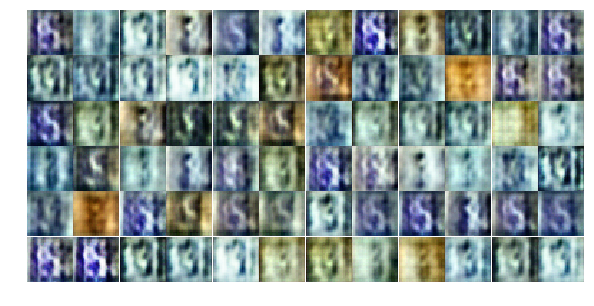

Epoch 4/25... Discriminator Loss: 0.8354... Generator Loss: 0.9263
Epoch 4/25... Discriminator Loss: 0.6964... Generator Loss: 2.4006
Epoch 4/25... Discriminator Loss: 0.7068... Generator Loss: 1.5924
Epoch 4/25... Discriminator Loss: 0.5313... Generator Loss: 1.9198
Epoch 4/25... Discriminator Loss: 0.9113... Generator Loss: 1.1962
Epoch 4/25... Discriminator Loss: 0.8986... Generator Loss: 1.1027
Epoch 4/25... Discriminator Loss: 0.8362... Generator Loss: 1.2110
Epoch 4/25... Discriminator Loss: 0.7288... Generator Loss: 1.5803
Epoch 4/25... Discriminator Loss: 0.5830... Generator Loss: 2.2091
Epoch 4/25... Discriminator Loss: 0.3788... Generator Loss: 2.1009


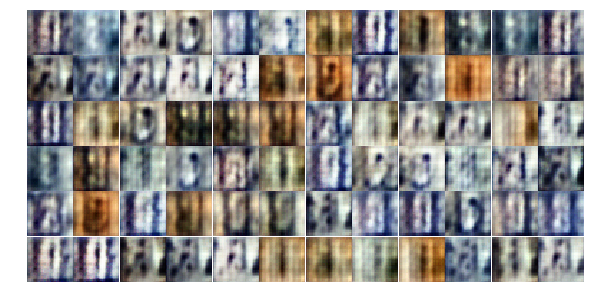

Epoch 4/25... Discriminator Loss: 0.7574... Generator Loss: 1.0978
Epoch 4/25... Discriminator Loss: 0.5217... Generator Loss: 1.4985
Epoch 4/25... Discriminator Loss: 0.7869... Generator Loss: 1.4069
Epoch 4/25... Discriminator Loss: 0.4359... Generator Loss: 1.8448
Epoch 4/25... Discriminator Loss: 0.9959... Generator Loss: 1.1968
Epoch 4/25... Discriminator Loss: 1.0839... Generator Loss: 0.8668
Epoch 4/25... Discriminator Loss: 0.6118... Generator Loss: 1.3319
Epoch 4/25... Discriminator Loss: 0.7025... Generator Loss: 1.6207
Epoch 4/25... Discriminator Loss: 0.6713... Generator Loss: 1.4461
Epoch 4/25... Discriminator Loss: 0.7012... Generator Loss: 2.7268


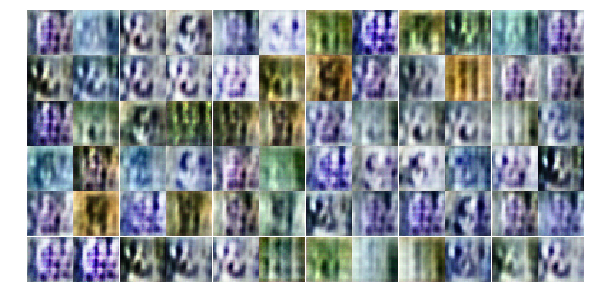

Epoch 4/25... Discriminator Loss: 1.0807... Generator Loss: 1.0045
Epoch 4/25... Discriminator Loss: 0.7508... Generator Loss: 0.9750
Epoch 4/25... Discriminator Loss: 0.4043... Generator Loss: 1.9291
Epoch 4/25... Discriminator Loss: 0.5863... Generator Loss: 2.6046
Epoch 4/25... Discriminator Loss: 1.1571... Generator Loss: 0.7562
Epoch 4/25... Discriminator Loss: 0.8905... Generator Loss: 0.9361
Epoch 4/25... Discriminator Loss: 0.7024... Generator Loss: 1.0642
Epoch 4/25... Discriminator Loss: 0.6824... Generator Loss: 2.7449
Epoch 4/25... Discriminator Loss: 0.5492... Generator Loss: 1.7544
Epoch 5/25... Discriminator Loss: 1.0080... Generator Loss: 0.7172


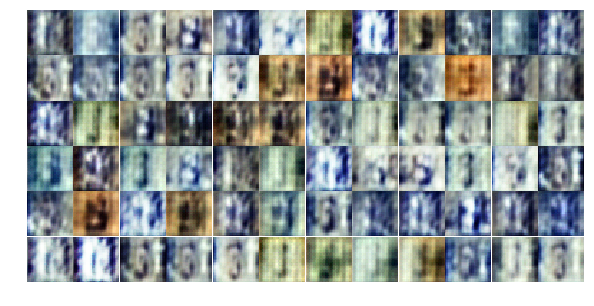

Epoch 5/25... Discriminator Loss: 0.6350... Generator Loss: 1.7768
Epoch 5/25... Discriminator Loss: 0.6296... Generator Loss: 1.1616
Epoch 5/25... Discriminator Loss: 0.9057... Generator Loss: 1.0803
Epoch 5/25... Discriminator Loss: 0.4550... Generator Loss: 2.0845
Epoch 5/25... Discriminator Loss: 0.8659... Generator Loss: 1.5468
Epoch 5/25... Discriminator Loss: 0.8919... Generator Loss: 0.9225
Epoch 5/25... Discriminator Loss: 0.8147... Generator Loss: 1.5720
Epoch 5/25... Discriminator Loss: 0.8384... Generator Loss: 1.0883
Epoch 5/25... Discriminator Loss: 0.6950... Generator Loss: 1.2953
Epoch 5/25... Discriminator Loss: 1.0514... Generator Loss: 0.7547


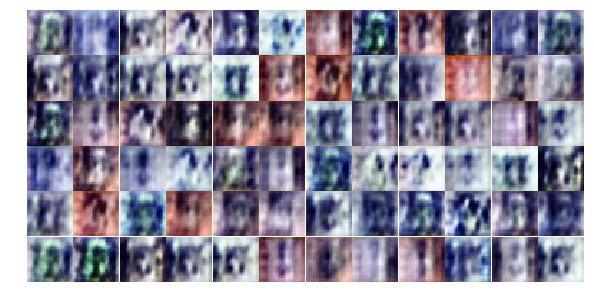

Epoch 5/25... Discriminator Loss: 0.7572... Generator Loss: 1.0725
Epoch 5/25... Discriminator Loss: 0.6737... Generator Loss: 2.5599
Epoch 5/25... Discriminator Loss: 0.7279... Generator Loss: 1.3699
Epoch 5/25... Discriminator Loss: 0.9649... Generator Loss: 1.3963
Epoch 5/25... Discriminator Loss: 0.7841... Generator Loss: 1.2217
Epoch 5/25... Discriminator Loss: 0.7697... Generator Loss: 1.2451
Epoch 5/25... Discriminator Loss: 0.8314... Generator Loss: 1.1710
Epoch 5/25... Discriminator Loss: 0.7811... Generator Loss: 2.3184
Epoch 5/25... Discriminator Loss: 0.5962... Generator Loss: 1.6362
Epoch 5/25... Discriminator Loss: 0.8438... Generator Loss: 1.6247


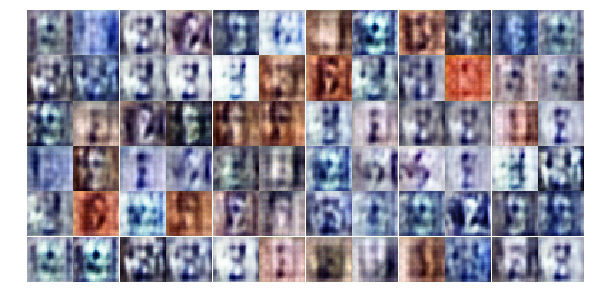

Epoch 5/25... Discriminator Loss: 0.5992... Generator Loss: 2.4299
Epoch 5/25... Discriminator Loss: 0.6214... Generator Loss: 2.0204
Epoch 5/25... Discriminator Loss: 0.8237... Generator Loss: 1.6795
Epoch 5/25... Discriminator Loss: 0.5894... Generator Loss: 1.6462
Epoch 5/25... Discriminator Loss: 1.0841... Generator Loss: 0.6405
Epoch 5/25... Discriminator Loss: 0.6276... Generator Loss: 1.6088
Epoch 5/25... Discriminator Loss: 0.7161... Generator Loss: 1.0930
Epoch 5/25... Discriminator Loss: 0.8552... Generator Loss: 1.0790
Epoch 5/25... Discriminator Loss: 0.7255... Generator Loss: 1.2566
Epoch 5/25... Discriminator Loss: 0.6566... Generator Loss: 1.6141


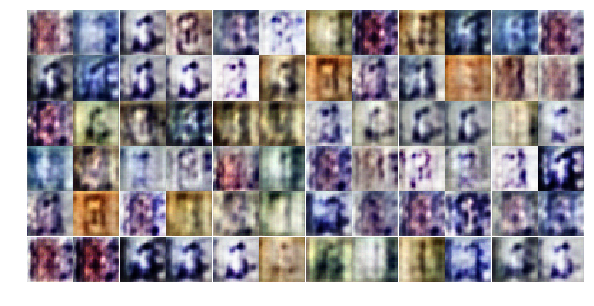

Epoch 5/25... Discriminator Loss: 0.9649... Generator Loss: 1.0646
Epoch 5/25... Discriminator Loss: 0.5306... Generator Loss: 1.4461
Epoch 5/25... Discriminator Loss: 0.4710... Generator Loss: 1.9091
Epoch 5/25... Discriminator Loss: 0.6227... Generator Loss: 1.3485
Epoch 5/25... Discriminator Loss: 0.6286... Generator Loss: 1.3001
Epoch 5/25... Discriminator Loss: 0.5486... Generator Loss: 2.3428
Epoch 5/25... Discriminator Loss: 0.5549... Generator Loss: 1.6079
Epoch 5/25... Discriminator Loss: 0.3717... Generator Loss: 2.3331
Epoch 5/25... Discriminator Loss: 0.8970... Generator Loss: 0.9650
Epoch 5/25... Discriminator Loss: 0.4682... Generator Loss: 1.7779


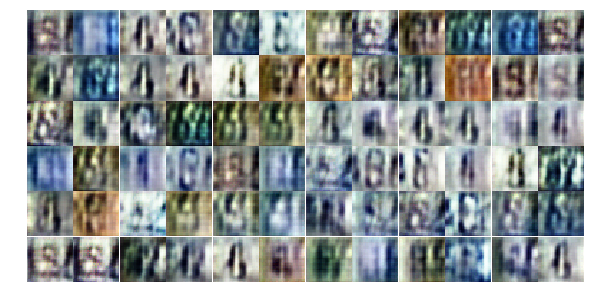

Epoch 5/25... Discriminator Loss: 0.6712... Generator Loss: 1.3367
Epoch 5/25... Discriminator Loss: 0.2318... Generator Loss: 2.1717
Epoch 5/25... Discriminator Loss: 0.9346... Generator Loss: 0.9022
Epoch 5/25... Discriminator Loss: 0.4849... Generator Loss: 1.6793
Epoch 5/25... Discriminator Loss: 0.5891... Generator Loss: 1.7942
Epoch 5/25... Discriminator Loss: 0.6804... Generator Loss: 1.8439
Epoch 5/25... Discriminator Loss: 0.8890... Generator Loss: 1.1586
Epoch 5/25... Discriminator Loss: 1.0023... Generator Loss: 3.1960
Epoch 5/25... Discriminator Loss: 0.6191... Generator Loss: 1.6642
Epoch 5/25... Discriminator Loss: 0.9267... Generator Loss: 1.5633


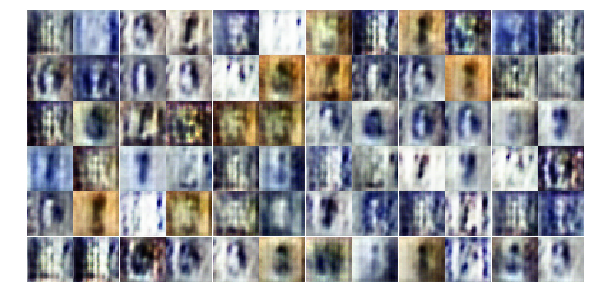

Epoch 5/25... Discriminator Loss: 0.8632... Generator Loss: 0.9436
Epoch 5/25... Discriminator Loss: 0.6394... Generator Loss: 1.2401
Epoch 5/25... Discriminator Loss: 0.6922... Generator Loss: 1.2389
Epoch 5/25... Discriminator Loss: 0.7743... Generator Loss: 1.6189
Epoch 5/25... Discriminator Loss: 0.5490... Generator Loss: 1.9967
Epoch 5/25... Discriminator Loss: 0.6446... Generator Loss: 1.5000
Epoch 6/25... Discriminator Loss: 0.7955... Generator Loss: 1.0380
Epoch 6/25... Discriminator Loss: 0.5777... Generator Loss: 1.6009
Epoch 6/25... Discriminator Loss: 0.4961... Generator Loss: 1.7699
Epoch 6/25... Discriminator Loss: 0.3062... Generator Loss: 2.3840


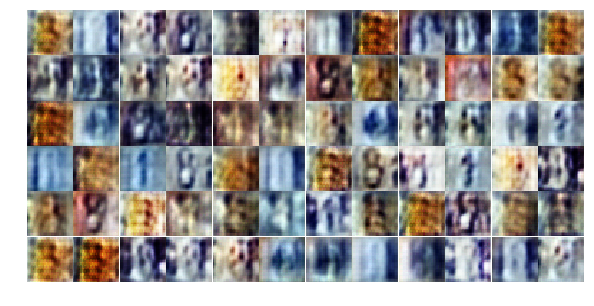

Epoch 6/25... Discriminator Loss: 0.7021... Generator Loss: 1.2287
Epoch 6/25... Discriminator Loss: 0.5675... Generator Loss: 2.3609
Epoch 6/25... Discriminator Loss: 0.5146... Generator Loss: 1.6365
Epoch 6/25... Discriminator Loss: 0.5039... Generator Loss: 1.8633
Epoch 6/25... Discriminator Loss: 0.6499... Generator Loss: 1.5075
Epoch 6/25... Discriminator Loss: 0.4335... Generator Loss: 2.0959
Epoch 6/25... Discriminator Loss: 0.5959... Generator Loss: 1.7410
Epoch 6/25... Discriminator Loss: 0.8449... Generator Loss: 2.8680
Epoch 6/25... Discriminator Loss: 0.3958... Generator Loss: 2.2690
Epoch 6/25... Discriminator Loss: 0.6082... Generator Loss: 1.6037


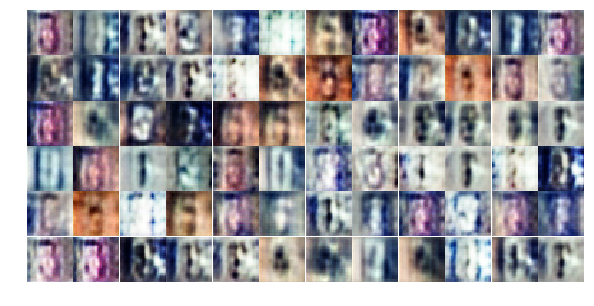

Epoch 6/25... Discriminator Loss: 0.4551... Generator Loss: 1.7545
Epoch 6/25... Discriminator Loss: 1.0877... Generator Loss: 0.7381
Epoch 6/25... Discriminator Loss: 0.7189... Generator Loss: 0.9689
Epoch 6/25... Discriminator Loss: 0.4345... Generator Loss: 2.0512
Epoch 6/25... Discriminator Loss: 0.4457... Generator Loss: 1.7232
Epoch 6/25... Discriminator Loss: 0.4720... Generator Loss: 1.6435
Epoch 6/25... Discriminator Loss: 0.5682... Generator Loss: 2.2855
Epoch 6/25... Discriminator Loss: 0.7930... Generator Loss: 0.9494
Epoch 6/25... Discriminator Loss: 0.5095... Generator Loss: 1.8210
Epoch 6/25... Discriminator Loss: 0.5405... Generator Loss: 1.8417


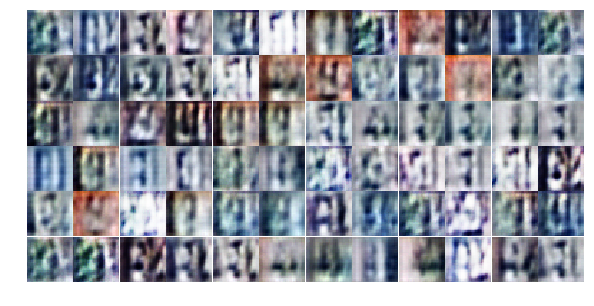

Epoch 6/25... Discriminator Loss: 0.7055... Generator Loss: 1.1412
Epoch 6/25... Discriminator Loss: 0.6442... Generator Loss: 1.1785
Epoch 6/25... Discriminator Loss: 0.8077... Generator Loss: 0.9886
Epoch 6/25... Discriminator Loss: 0.6907... Generator Loss: 1.3371
Epoch 6/25... Discriminator Loss: 0.8672... Generator Loss: 1.4775
Epoch 6/25... Discriminator Loss: 0.5876... Generator Loss: 2.0520
Epoch 6/25... Discriminator Loss: 1.0689... Generator Loss: 0.7534
Epoch 6/25... Discriminator Loss: 0.3591... Generator Loss: 2.1885
Epoch 6/25... Discriminator Loss: 0.4820... Generator Loss: 1.7018
Epoch 6/25... Discriminator Loss: 0.4206... Generator Loss: 2.3897


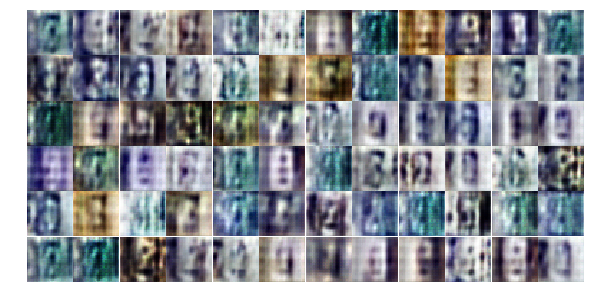

Epoch 6/25... Discriminator Loss: 0.7562... Generator Loss: 1.4033
Epoch 6/25... Discriminator Loss: 0.3475... Generator Loss: 2.2324
Epoch 6/25... Discriminator Loss: 0.4263... Generator Loss: 1.7226
Epoch 6/25... Discriminator Loss: 0.6919... Generator Loss: 1.2873
Epoch 6/25... Discriminator Loss: 0.5102... Generator Loss: 1.5232
Epoch 6/25... Discriminator Loss: 0.3573... Generator Loss: 2.3458
Epoch 6/25... Discriminator Loss: 0.5172... Generator Loss: 1.3140
Epoch 6/25... Discriminator Loss: 0.5927... Generator Loss: 1.4136
Epoch 6/25... Discriminator Loss: 0.7841... Generator Loss: 2.6351
Epoch 6/25... Discriminator Loss: 0.5935... Generator Loss: 1.5553


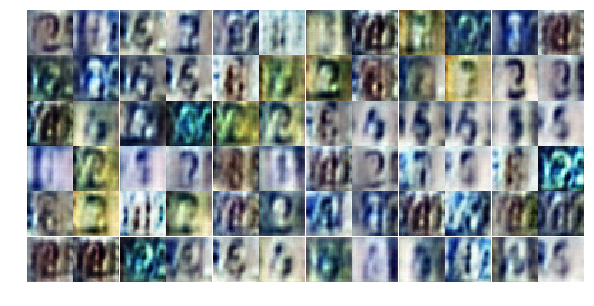

Epoch 6/25... Discriminator Loss: 0.9691... Generator Loss: 1.1005
Epoch 6/25... Discriminator Loss: 0.5684... Generator Loss: 2.0862
Epoch 6/25... Discriminator Loss: 0.3628... Generator Loss: 2.1125
Epoch 6/25... Discriminator Loss: 0.7514... Generator Loss: 0.9967
Epoch 6/25... Discriminator Loss: 0.5267... Generator Loss: 2.7470
Epoch 6/25... Discriminator Loss: 0.4648... Generator Loss: 1.8890
Epoch 6/25... Discriminator Loss: 0.4526... Generator Loss: 2.2706
Epoch 6/25... Discriminator Loss: 0.6609... Generator Loss: 1.0441
Epoch 6/25... Discriminator Loss: 0.6395... Generator Loss: 1.6446
Epoch 6/25... Discriminator Loss: 0.6254... Generator Loss: 1.4401


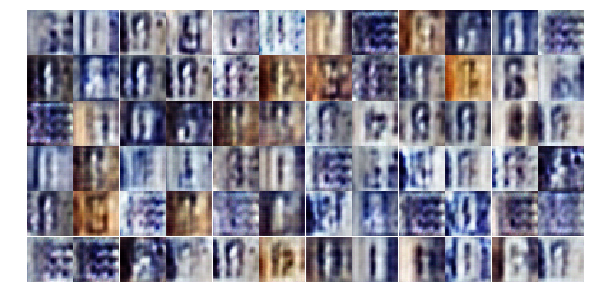

Epoch 6/25... Discriminator Loss: 0.5201... Generator Loss: 1.6011
Epoch 6/25... Discriminator Loss: 0.5660... Generator Loss: 1.9584
Epoch 6/25... Discriminator Loss: 0.6338... Generator Loss: 1.5110
Epoch 7/25... Discriminator Loss: 0.4482... Generator Loss: 1.7282
Epoch 7/25... Discriminator Loss: 0.4929... Generator Loss: 1.8458
Epoch 7/25... Discriminator Loss: 0.4090... Generator Loss: 2.1328
Epoch 7/25... Discriminator Loss: 0.3501... Generator Loss: 2.1783
Epoch 7/25... Discriminator Loss: 0.7648... Generator Loss: 0.9573
Epoch 7/25... Discriminator Loss: 0.3590... Generator Loss: 2.0835
Epoch 7/25... Discriminator Loss: 0.2164... Generator Loss: 2.7287


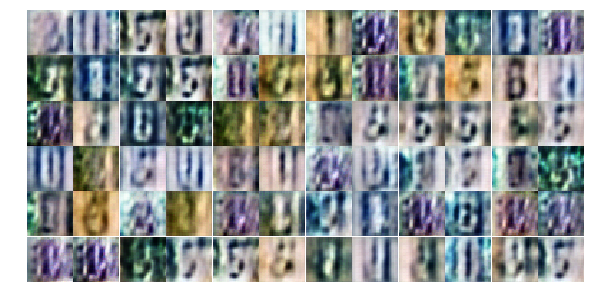

Epoch 7/25... Discriminator Loss: 0.4286... Generator Loss: 2.6690
Epoch 7/25... Discriminator Loss: 0.4441... Generator Loss: 1.8072
Epoch 7/25... Discriminator Loss: 0.5454... Generator Loss: 1.8752
Epoch 7/25... Discriminator Loss: 0.3605... Generator Loss: 2.5337
Epoch 7/25... Discriminator Loss: 0.3582... Generator Loss: 2.7743
Epoch 7/25... Discriminator Loss: 0.7664... Generator Loss: 1.3160
Epoch 7/25... Discriminator Loss: 0.7027... Generator Loss: 1.5351
Epoch 7/25... Discriminator Loss: 0.9987... Generator Loss: 4.1112
Epoch 7/25... Discriminator Loss: 0.6004... Generator Loss: 2.1680


In [ ]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

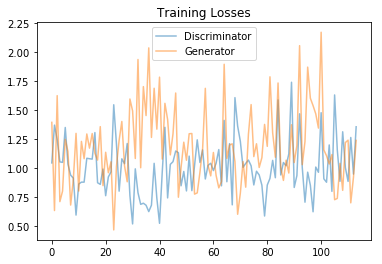

In [18]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

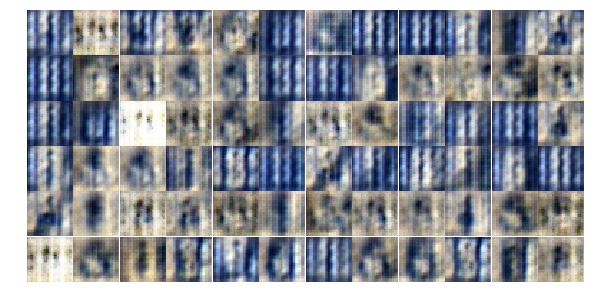

In [19]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))